## import libarary

In [2]:
import numpy as np
import cv2
import tensorflow as tf
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import datasets
import tensorflow_datasets as tfds
import matplotlib.pyplot as plot
from skimage.feature import local_binary_pattern
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt



##  Load the Caltech101 dataset


In [4]:
# Load the Caltech101 dataset
dataset, info = tfds.load('caltech101', with_info=True, as_supervised=True)

# Split the dataset into training and testing
train_data = dataset['train']
test_data = dataset['test']

In [5]:
# Resize with padding function
def resize_with_padding(image, target_size=(64, 64)):
    h, w = image.shape[:2]
    scale = min(target_size[1] / w, target_size[0] / h)
    resized_image = cv2.resize(image, (int(w * scale), int(h * scale)))
    
    delta_w = target_size[1] - resized_image.shape[1]
    delta_h = target_size[0] - resized_image.shape[0]
    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)
    padded_image = cv2.copyMakeBorder(resized_image, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0, 0, 0])
    return padded_image


## Convert train and test data into numpy arrays


In [7]:
def process_data(data, image_size=(64, 64)):
    images = []
    labels = []

    for image, label in data:
        # Resize with padding
        image_resized = resize_with_padding(image.numpy(), image_size).astype('float32') / 255.0
        images.append(image_resized)
        labels.append(label.numpy())
    
    return np.array(images), np.array(labels)

## Load and preprocess training and testing data


In [9]:
X_train, y_train = process_data(train_data)
X_test, y_test = process_data(test_data)

In [10]:
X_train.shape

(3059, 64, 64, 3)

## Convert images to grayscale


In [12]:
X_train_gray = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in X_train])
X_test_gray = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in X_test])

In [13]:
X_train_gray.shape

(3059, 64, 64)

## Function to compute LBP histogram


In [15]:
def compute_lbp_histogram(image, radius=1, n_points=8):
    # Compute the LBP image using skimage's local_binary_pattern
    lbp_image = local_binary_pattern(image, n_points, radius, method='uniform')
    
    # Compute the histogram of the LBP image
    lbp_hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, 257), range=(0, 256))
    
    # Normalize the histogram
    lbp_hist = lbp_hist.astype(float)
    lbp_hist /= lbp_hist.sum()  # Normalize the histogram to make it a probability distribution
    
    return lbp_hist

## Now apply LBP on each grayscale image to get the histograms


In [17]:
X_train_lbp = np.array([compute_lbp_histogram(img) for img in X_train_gray])
X_test_lbp = np.array([compute_lbp_histogram(img) for img in X_test_gray])
X_train_lbp.shape


C:\Users\Ahmedmohamed\anaconda3\Lib\site-packages\skimage\feature\texture.py:360: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


(3059, 256)

In [18]:
X_test_lbp.shape

(6085, 256)

## Training the Kmean model on the Training set


In [20]:
# Function to compute Euclidean distance
def euclidean_distance(point1, point2):
    return np.sqrt(np.sum((point1 - point2)**2))

class KMeans:

    def __init__(self, num_clusters=5, max_iterations=100, show_steps=False):
        """
        Initialize the KMeans clustering algorithm.
        - num_clusters: Number of clusters (K)
        - max_iterations: Maximum number of iterations to run the algorithm
        - show_steps: Whether to display plots during the iterations
        """
        self.num_clusters = num_clusters
        self.max_iterations = max_iterations
        self.show_steps = show_steps

        # Initialize empty clusters
        self.clusters = [[] for _ in range(self.num_clusters)]

        # Initialize empty center of mass
        self.centers_of_mass = []


    def _assign_cluster_labels(self, clusters):
        """
        Purpose: This function assigns a label (cluster index) to each sample based on the cluster it belongs to.
        """
        labels = np.empty(self.n_samples)  ##empty array with same no of samples
        for cluster_idx, cluster in enumerate(clusters): #loop  f cluster_idx=0, cluster=1,2,3  clusters[[1,2,3],[....],,,,}
            for sample_idx in cluster:
                labels[sample_idx] = cluster_idx
        return labels

    def _create_clusters(self, centers_of_mass):
        """
        Purpose: This function creates the clusters by assigning each sample in X to the nearest centroid.
        For each data point, it calculates the distance to each centroid using the euclidean_distance function, and assigns it to the cluster whose centroid is the closest.
        """
        clusters = [[] for _ in range(self.num_clusters)]
        for idx, sample in enumerate(self.data):
            center_idx = self._find_closest_center_of_mass(sample, centers_of_mass)
            clusters[center_idx].append(idx)
        return clusters

    def _find_closest_center_of_mass(self, sample, centers_of_mass):
        """
        Find the index of the closest center of mass to a given sample.
        - sample: A single data point
        - centers_of_mass: List of centers of mass
        Purpose: This function finds the index of the closest centroid for a given data point (sample).
        It calculates the Euclidean distance between the sample and each centroid and returns the index of the centroid with the smallest distance.
        """
        distances = [euclidean_distance(sample, center) for center in centers_of_mass]
        closest_idx = np.argmin(distances)
        return closest_idx

    def _compute_new_centers_of_mass(self, clusters):
        """
        Compute the new centers of mass based on the current clusters.
        - clusters: List of clusters (each cluster contains the indices of data points)
        Purpose: This function recalculates the centroids of the clusters by computing the mean of all the points in each cluster.
        If a cluster is empty (it happens sometimes if some clusters don't get assigned any points), a random data point is selected as the centroid.
        """
        centers_of_mass = np.zeros((self.num_clusters, self.n_features))
        for cluster_idx, cluster in enumerate(clusters):
            if len(cluster) == 0:
                # If a cluster is empty, reinitialize it with a random data point
                centers_of_mass[cluster_idx] = self.data[np.random.choice(self.n_samples)]
            else:
                # Compute the mean of the points in the cluster as the new center of mass
                centers_of_mass[cluster_idx] = np.mean(self.data[cluster], axis=0)
        return centers_of_mass

    def _has_converged(self, old_centers_of_mass, new_centers_of_mass, tolerance=1e-4):
        """
        Check if the centers of mass have converged by comparing the old and new centers.
        - old_centers_of_mass: List of centers of mass from the previous iteration
        - new_centers_of_mass: List of centers of mass from the current iteration
        - tolerance: The threshold to consider as convergence
        """
        distances = [euclidean_distance(old_centers_of_mass[i], new_centers_of_mass[i]) for i in range(self.num_clusters)]
        return sum(distances) < tolerance
    def fit(self, feature):
        """
        It initializes centroids randomly from the data points.
        Then it runs the iterative process of clustering the data points based on their distance to centroids and recalculating the centroids until convergence (or max iterations).
        Once the process converges, it returns the cluster labels (the index of the closest cluster for each sample).
        """
        
        self.data = feature
        self.n_samples, self.n_features = data.shape

        # Randomly initialize center of mass by choosing random data points
        random_sample_indices = np.random.choice(self.n_samples, self.num_clusters, replace=False)
        self.centers_of_mass = [self.data[idx] for idx in random_sample_indices]

        # Iteratively update centers of mass and clusters
        for _ in range(self.max_iterations):
            # Create new clusters based on the closest centers of mass
            self.clusters = self._create_clusters(self.centers_of_mass)

            # Show the clustering steps if enabled
            if self.show_steps:
                self.plot()

            # Save the old centers of mass
            centers_of_mass_old = self.centers_of_mass

            # Update centers of mass based on the new clusters
            self.centers_of_mass = self._compute_new_centers_of_mass(self.clusters)

            # Check for convergence
            if self._has_converged(centers_of_mass_old, self.centers_of_mass):
                break

            # Plot the clusters if show_steps is enabled
            if self.show_steps:
                self.plot()

        # Return the cluster labels for each sample
        return self._assign_cluster_labels(self.clusters)

    def plot(self):
        """
        Plot the clusters and centers of mass in 2D (using PCA for dimensionality reduction).
        """
        self.plot_clusters_in_2d()

    def plot_clusters_in_2d(self):
        """
        Plot the clusters in 2D after reducing the dimensionality using PCA.
        """
        pca = PCA(n_components=2)
        reduced_data = pca.fit_transform(self.data)

        fig, ax = plt.subplots(figsize=(12, 8))

        # Plot each cluster
        for i, cluster in enumerate(self.clusters):
            points = reduced_data[cluster]
            ax.scatter(points[:, 0], points[:, 1], label=f"Cluster {i}")

        # Plot the centers of mass in 2D space
        centers_of_mass_2d = pca.transform(self.centers_of_mass)
        ax.scatter(centers_of_mass_2d[:, 0], centers_of_mass_2d[:, 1], marker="x", color="black", linewidth=2, s=100)

        ax.legend()
        plt.show()


In [21]:
combined_lbp = np.vstack((X_train_lbp, X_test_lbp))

In [22]:
combined_y = np.hstack((y_train, y_test))

In [23]:
clusters = len(np.unique(combined_y))

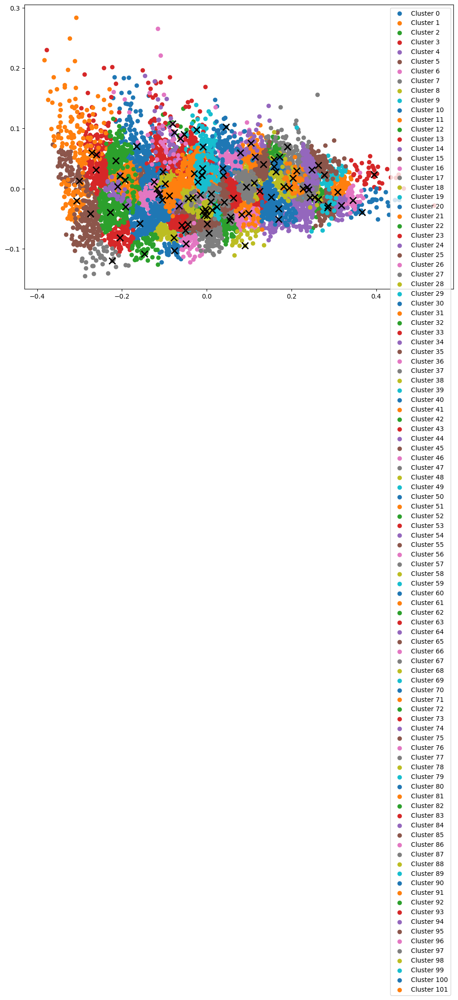

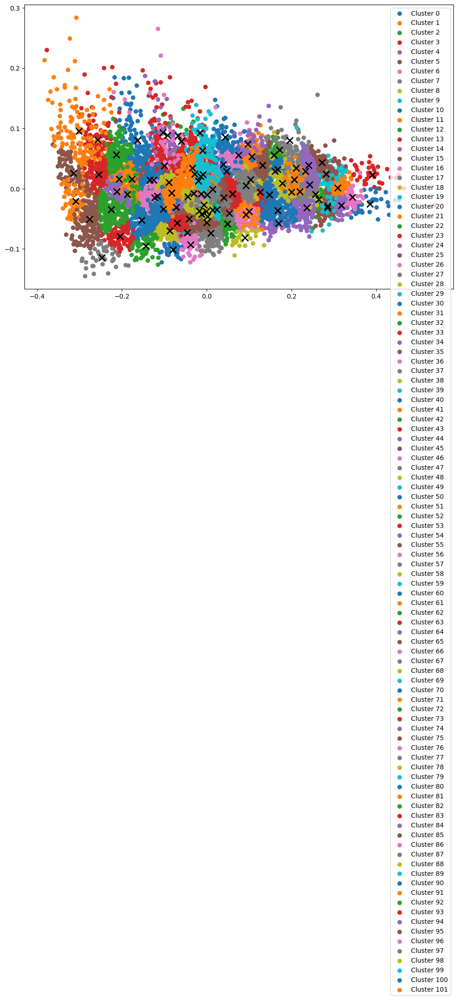

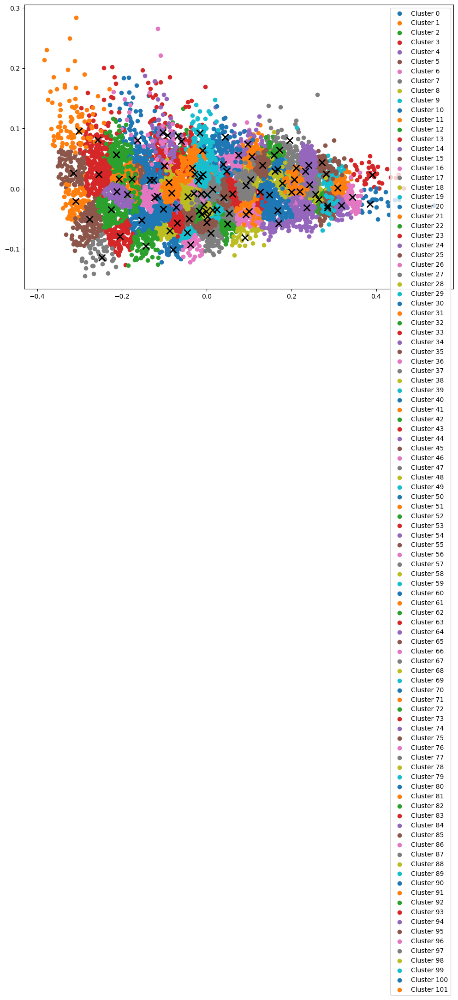

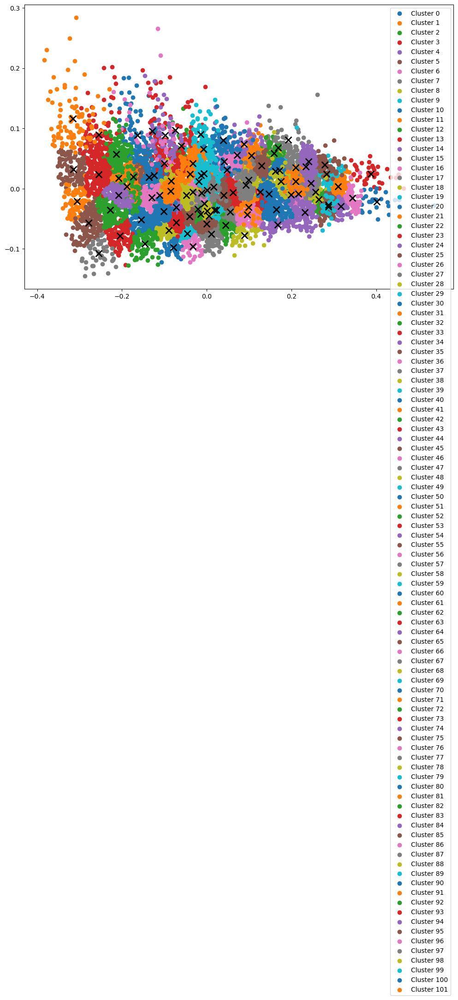

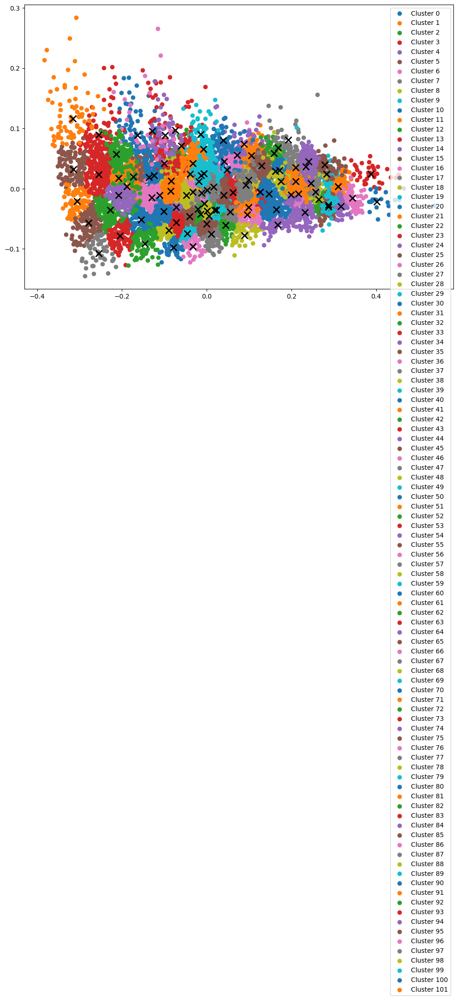

...

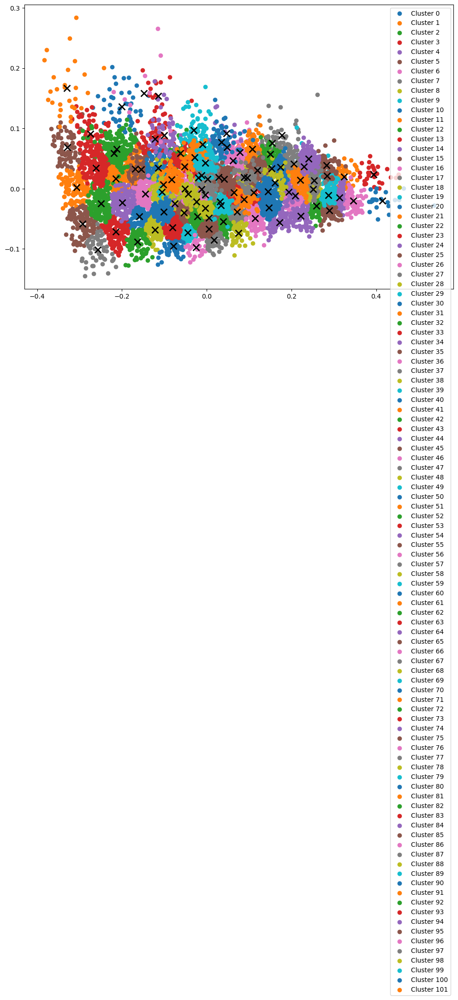

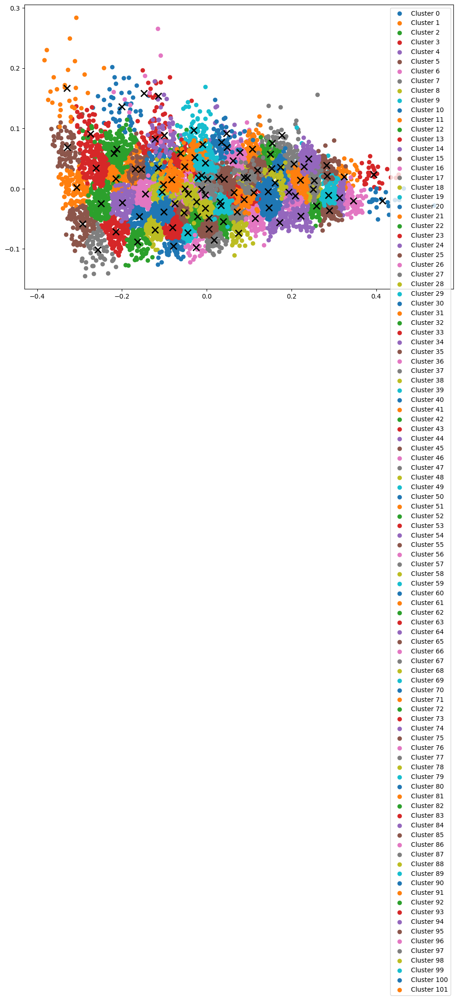

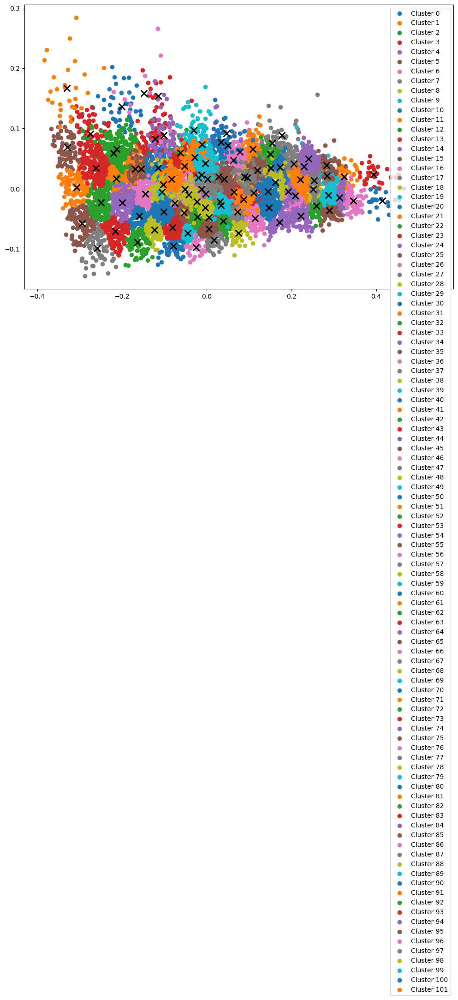

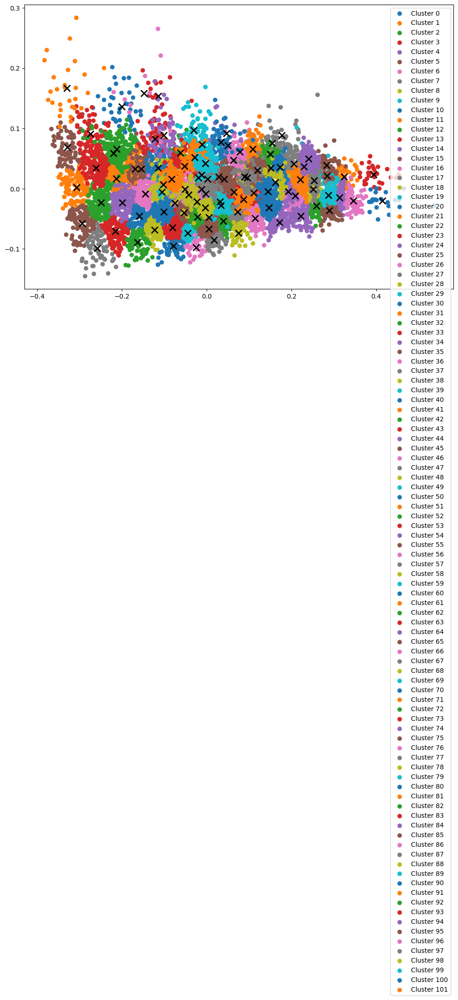

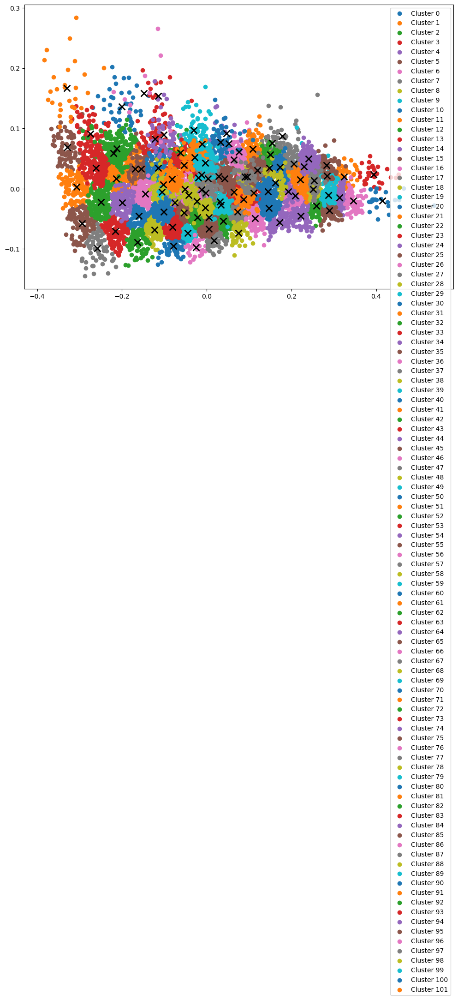

In [29]:
k = KMeans(num_clusters=clusters, max_iterations=20, show_steps=True)
y_pred = k.fit(combined_lbp)

In [30]:
combined_y = np.hstack((y_train, y_test))

In [31]:
y_pred.shape


(9144,)

In [32]:
combined_y.flatten().shape

(9144,)

## Evaluate the classifier's performance


In [34]:
from scipy.stats import mode
import numpy as np

def calculate_kmeans_accuracy(true_labels, cluster_labels):
    # Map each cluster to the majority true label
    new_labels = np.zeros_like(cluster_labels)

    for cluster in np.unique(cluster_labels):
        mask = cluster_labels == cluster
        if np.any(mask):  # Check if the mask contains any True values
            # Find the most common true label in this cluster
            majority_label = mode(true_labels[mask]).mode
            # Handle scalar or array-like mode output
            majority_label = majority_label if np.ndim(majority_label) == 0 else majority_label[0]
            new_labels[mask] = majority_label

    # Calculate accuracy
    accuracy = np.mean(true_labels == new_labels)
    return accuracy


In [35]:

accuracy = calculate_kmeans_accuracy(combined_y.flatten(), y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 30.75%
